# Rewiring in the Bioenergetic Food-Web Model (BEFWM)

In this tutorial, we will see how to set up the BEFWM package to trigger rewiring following three different models: 
- one based on diet overlap by [Staniczenko et al.](https://onlinelibrary.wiley.com/doi/10.1111/j.1461-0248.2010.01485.x)
- one based on diet similarity by [Gilljam et al.](https://www.nature.com/articles/ncomms9412?origin=ppub)
- and one based on body size and foraging theory (the allometric diet breadth model - ADBM) by [Petchey et al.](https://www.pnas.org/content/105/11/4191)

## Table of content 

* [Step 1: Generating the initial conditions](##Step-1:-Generating-the-initial-conditions)
* [Step 2: Chosing a rewiring model](##Step-2:-Chosing-a-rewiring-model)
    * [The Diet Overlap method (Staniczenko et al.)](###The-Diet-Overlap-method-(Staniczenko-et-al.))
    * [The Diet Similarity method (Gilljam et al.)](###The-Diet-Similarity-method-(Gilljam-et-al.))
    * [The Allometric Diet Breadth Model (Petchey et al.)](###The-Allometric-Diet-Breadth-Model-(Petchey-et-al.))
* [Step 3: Working with the outputs](##Step-3:-Working-with-the-outputs)

In [56]:
import Pkg
Pkg.activate(".")
using BioEnergeticFoodWebs, EcologicalNetworks
include("src/utils.jl") 
import Random.seed!
import Statistics.mean
seed!(55586)
Pkg.status()

 Activating environment at `~/projets/JuliaTutorials/Project.toml`


Status `~/projets/JuliaTutorials/Project.toml`
  [9b49b652] BioEnergeticFoodWebs v1.2.0 `https://github.com/PoisotLab/BioEnergeticFoodWebs.jl.git#dev-1.3.0`
  [f03a62fe] EcologicalNetworks v0.4.3
  [91a5bcdd] Plots v1.13.2
  [9a3f8284] Random


## Step 1: Generating the initial conditions

First, as for all simulations with the simulations with the BioEnergeticFoodWebs.jl package, we need to specify the parameters, starting with an initial food web structure and its body size distribution. Here we will specify calculate explicitely the vector of body mass so that we can order the interaction matrix A by increasing mass (this will help us compare the outputs of the different rewiring models). 

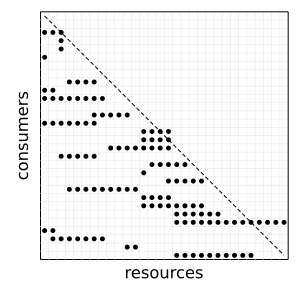

In [41]:
S = 30 #number of species
C = 0.15 #expected connectance
A = EcologicalNetworks.nichemodel(S, C).edges #generates the food web
A = Int.(Array(A)) #transform the interaction matrix into a format compatible with BEFWM
pltA = webplot(A, consasrow = true) #true means that we want to have consumers plotted as rows(i) and resources as columns (j)

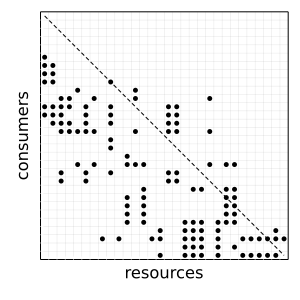

In [42]:
#we can calculate species mass based on their trophic rank and Z, the consumer resource mass ratio
Z = 10 #consumers are in average 10 times bigger than their prey
M = Z .^ (trophic_rank(A) .- 1)
#now for visualisation purposes let's order the matrix by increasing body mass
M_order = sortperm(M)
M = M[M_order]
A = A[M_order, M_order]
# and we can re-plot A, now sorted by mass
pltAsorted = webplot(A, consasrow = true)
#the resulting plot shows the interaction matrix A
#A[i,j] = 1 is represented by a black dot and means that i eats j. 
#Dots on the diagonal indicate canibalism (i eats i).
#the sorted niche model food web looks messy because its generation is not based on mass

In [43]:
# Generate the sets of parameters

#no rewiring is the default, technically you don't need to specify rewire_method in that case
p_none = model_parameters(A, bodymass = M, h = 2.0, rewire_method = :none) 

Dict{Symbol,Any} with 36 entries:
  :α               => 1.0
  :e_carnivore     => 0.85
  :Γh              => [0.0, 0.0, 0.0, 0.0, 0.0, 0.25, 0.25, 0.25, 0.25, 0.25  ……
  :m_producer      => 1.0
  :h               => 2.0
  :c               => [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0…
  :vertebrates     => Bool[0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  0, 0, 0, 0, 0, 0, 0…
  :tmpA            => Any[]
  :rewire_method   => :none
  :trophic_rank    => [1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 2.33333, 2.5  … …
  :w               => [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 …
  :TSR_type        => :no_response
  :e_herbivore     => 0.45
  :productivity    => :species
  :efficiency      => [0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 …
  :K               => [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0  …  1.0…
  :S               => 30
  :extinctionstime => Any[]
  :is_producer     => Bool[1, 1, 1, 1, 1, 0, 0, 0, 0, 0  …  0, 0, 0, 0, 0, 0, 0…
  :dp      

To change the rewiring method, simply change the keyword argument `rewire_method` from `none` to 
- `:DO` for the diet overlap method
- `:DS` for the diet similarity method
- `:ADBM` for the allometric diet breadth model

Note that the ADBM method is a bit more trickier and more parameters are needed to properly set up the model. We will start with the simpler diet overlap and similarity methods. 

In [44]:
# Set up simulations
b0 = rand(S) #random starting biomasses
tstop = 10000 #simulation time
ϵ = 1e-10 #extinction threshold
#when a species biomass reaches the extinction threshold, it's considered as
#extinct. It's important to know the extinction threshold when using rewiring because 
#rewiring will be triggered at each extinction event during the simulations. 
# (We'll see later how this can be different for the ADBM)

1.0e-10

## Step 2: Chosing a rewiring model

### The Diet Overlap method (Staniczenko et al.)

In [45]:
p_do = model_parameters(A, bodymass = M, h = 2.0, rewire_method = :DO) 
s_do = simulate(p_do, b0, stop = tstop, extinction_threshold = ϵ)

Dict{Symbol,Any} with 3 entries:
  :p => Dict{Symbol,Any}(:α=>1.0,:e_carnivore=>0.85,:Γh=>[0.0, 0.0, 0.0, 0.0, 0…
  :B => [0.174801 0.999088 … 0.434966 0.325382; 0.185915 0.797144 … 0.439473 0.…
  :t => [0.0, 0.25, 0.5, 0.75, 1.0, 1.25, 1.5, 1.75, 2.0, 2.25  …  9997.75, 999…

We can visualize both the biomass dynamics and the resulting matrix

In [46]:
plt_dyn_do = plot(s_do[:t], s_do[:B], leg = false, c = :black, ylims = (-0.01,3), xlabel = "time", ylabel = "biomass")
plt_mat_do = webplot(p_do[:A], consasrow = true)
plot(plt_dyn_do, plt_mat_do, size = (750, 400))

One thing that can be confusing when looking at the interaction matrix above is that we can't visually distinguish between the producers (row sum = 0) that may be disconnected from the rest of the community (column sum = 0 when they have no consumer) due to the extinction of their consumer(s), and the species that are extinct (row sum and column sum are both 0). We will see on the section [Step 3: Working with the outputs](##Step-3:-Working-with-the-outputs)

### The Diet Similarity method (Gilljam et al.)

Coming soon

### The Allometric Diet Breadth Model (Petchey et al.)

Coming soon

## Step 3: Working with the outputs

As we stated above, the updated matrix in its current form is not particularly helpful. One thing we can do is try updating it by completely removing the extinct species, thus changing its dimensions, based on the information we have: 
- the identity of the producers
- the identity of the extinct species 
It will also be important that we check that we have reached a steady state to avoid having doomed species still identified as persistent in the community. We will test that by checking that no consumers are disconnected. 

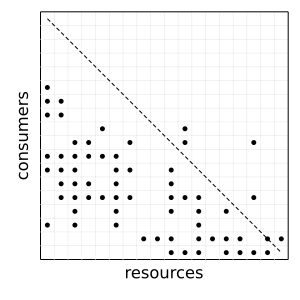

In [52]:
# This function (defined in utils.jl) does exactly what is axplained above, 
# it removes the species that are extinct from the interaction matrix
# and also checks for disconnected consumers. If this function detects any disconnected consumer
# it will return a vector of species identity (the disconnected consumers identified) instead of 
# an updated interaction matrix
new_A = updateA(s_do)
webplot(new_A)

Now we can recalculate many descriptors of food web structure with this updated matrix: 

In [58]:
original_height = maximum(trophic_rank(A))
updated_height = maximum(trophic_rank(new_A))
original_avgindegree = mean(sum(A, dims = 1))
updated_avgindegree = mean(sum(new_A, dims = 1))
original_connectance = sum(A) / (S ^ 2)
updated_connectance = sum(new_A) / (size(new_A, 1) ^ 2)
structural_change = (height = round(updated_height - original_height, digits = 2)
                   , avg_indegree = round(updated_avgindegree - original_avgindegree, digits = 2)
                   , connectance = round(updated_connectance - original_connectance, digits = 2)) 

(height = -0.48, avg_indegree = -0.64, connectance = 0.06)